# Chapinero TrueSkill Based Street Image Ranking  

In [1]:
import numpy as np
from numpy import genfromtxt
from trueskill import TrueSkill, Rating, quality_1vs1, rate_1vs1
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
from scipy import stats
import operator as op
import pandas as pd
from ast import literal_eval

In [2]:
TrueSkill(backend='scipy').cdf

<bound method rv_continuous.cdf of <scipy.stats._continuous_distns.norm_gen object at 0x18158eb438>>

### Actual Chapinero votes (5505 images, 18959 actual votes)
_______________

In [3]:
def actualOneMatchSycleVoteTrueSkillExplorer(randomIndexerSPath, imgSetSize, zoneName):
    IMG_SET_SIZE = imgSetSize
    # load synthetic vote list
    # randomChapVts = genfromtxt('../randomvotes/randomIndexerSChap.txt', delimiter=',')
    # randomChapVtsPredictions = genfromtxt('../predicts/randomIndexerSChap4predict.predict', delimiter=' ')
    
    randomChapVts = genfromtxt(randomIndexerSPath, delimiter=',')
    
    print(randomChapVts.shape)
            
    # initial default rating object building
    rankingDict = dict()
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        rankingDict[imgIdx] = dict()
        rankingDict[imgIdx]["rating"] = Rating()
        rankingDict[imgIdx]["vCounter"] = 0
        rankingDict[imgIdx]["vIndex"] = 0
        rankingDict[imgIdx]["opponets"] = []
        for rowVote in range(randomChapVts.shape[0]):
            if randomChapVts[rowVote][0] == imgIdx:
                rankingDict[imgIdx]["opponets"].append({"opp":randomChapVts[rowVote][1], "out":randomChapVts[rowVote][2]})
        
        rankingDict[imgIdx]["vCounter"] = len(rankingDict[imgIdx]["opponets"])        
        

    print("%s published image set size: %d" % (zoneName,len(rankingDict)))
    
    zeroVotes = 0
    oneVotes = 0
    twoVotes = 0
    
    votCounter = randomChapVts.shape[0]
    while votCounter > 0:
        for imgIdx in range(1, (IMG_SET_SIZE + 1)):
            if rankingDict[imgIdx]["vIndex"] < rankingDict[imgIdx]["vCounter"]:
                opponentIdx  = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["opp"]
                out = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["out"]
                if out == 0:
                    zeroVotes = zeroVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"],
                                                                                                 drawn=True)
                elif out == 1:
                    oneVotes = oneVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"])
                elif out == 2:
                    twoVotes = twoVotes + 1
                    rankingDict[opponentIdx]["rating"], rankingDict[imgIdx]["rating"] = rate_1vs1(rankingDict[opponentIdx]["rating"],
                                                                                                  rankingDict[imgIdx]["rating"])
                else:
                    print("NO VALID VOTE CODE")
            
                rankingDict[imgIdx]["vIndex"] = rankingDict[imgIdx]["vIndex"] + 1
                votCounter = votCounter - 1
                
                
                
    print("Zero votes %d" % zeroVotes)
    print("One votes %d" % oneVotes)
    print("Two votes %d" % twoVotes)
    print("Total votes %d" % (zeroVotes+oneVotes+twoVotes))
    
    # obtain mu statistics
    mu = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        mu[imgIdx-1] = rankingDict[imgIdx]["rating"].mu

    print("Min mu %f" % np.min(mu))
    print("Max mu %f" % np.max(mu))
    print("Mean mu %f" % np.mean(mu))
    print("Std mu %f" % np.std(mu))
    
    
    
    # obtain sigma statistics
    sigma = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        sigma[imgIdx-1] = rankingDict[imgIdx]["rating"].sigma

    print("Min sigma %f" % np.min(sigma))
    print("Max sigma %f" % np.max(sigma))
    print("Mean sigma %f" % np.mean(sigma))
    print("Std sigma %f" % np.std(sigma))
        
    # generate output file
    out = np.zeros((IMG_SET_SIZE, 3))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        out[imgIdx-1][0] = imgIdx
        out[imgIdx-1][1] = rankingDict[imgIdx]["rating"].mu
        out[imgIdx-1][2] = rankingDict[imgIdx]["rating"].sigma
        
    
    fileName = "descriptorIndexer_Jul_0518OneMatchRating.csv"
    print("Out file name %s" % fileName)
    np.savetxt(fileName, out, fmt='%i,%f,%f', delimiter=",")
    return mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, (zeroVotes+oneVotes+twoVotes)

In [85]:
chapineroOneMatch = {}
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = actualOneMatchSycleVoteTrueSkillExplorer(randomIndexerSPath = "../descriptorIndexer_Jul_0518.txt",
                                                                                                          imgSetSize = 5505,
                                                                                                          zoneName = "Chapinero")
chapineroOneMatch["actual"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(18959, 3)
Chapinero published image set size: 5505
Zero votes 6190
One votes 6306
Two votes 6463
Total votes 18959
Min mu 11.953767
Max mu 37.937963
Mean mu 25.060391
Std mu 5.026169
Min sigma 2.712683
Max sigma 5.282752
Mean sigma 3.523156
Std sigma 0.344519
Out file name descriptorIndexer_Jul_0518OneMatchRating.csv


/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


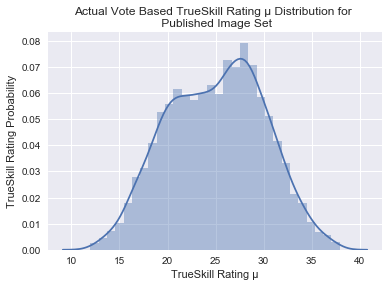

In [12]:
ax = sns.distplot(chapineroOneMatch["actual"]["mu"]);
ax.set(xlabel='TrueSkill Rating μ',
       ylabel='TrueSkill Rating Probability',
      title='Actual Vote Based TrueSkill Rating μ Distribution for \n Published Image Set')
plt.savefig('actualVtSkill1', format='pdf')
plt.show()

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


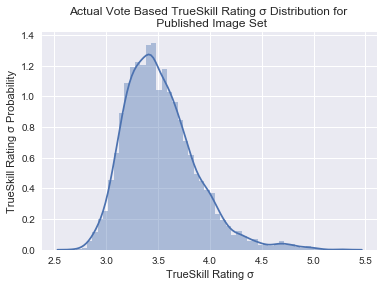

In [13]:
ax = sns.distplot(chapineroOneMatch["actual"]["sigma"]);
ax.set(xlabel='TrueSkill Rating σ',
       ylabel='TrueSkill Rating σ Probability',
      title='Actual Vote Based TrueSkill Rating σ Distribution for \n Published Image Set')
plt.savefig('actualVtSkill2', format='pdf')
plt.show()

###  Synthetic Vote TrueSkill Exploration Functions
_____________________________________________________________________


#### syntheticOneMatchCycleVoteTrueSkillExplorer
____

In [4]:
# This function implements TrueSkill score workout by a single match at a time per image. This is more like a tournamen
# where there are match cycles.
def syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold, randomIndexerSPath,randomIndexerSPredictedPath, imgSetSize, zoneName):
    IMG_SET_SIZE = imgSetSize
    # load synthetic vote list
    # randomChapVts = genfromtxt('../randomvotes/randomIndexerSChap.txt', delimiter=',')
    # randomChapVtsPredictions = genfromtxt('../predicts/randomIndexerSChap4predict.predict', delimiter=' ')
    
    randomChapVts = genfromtxt(randomIndexerSPath, delimiter=',')
    randomChapVtsPredictions = genfromtxt(randomIndexerSPredictedPath, delimiter=' ')
    
    print(randomChapVts.shape)
    print(randomChapVtsPredictions.shape)
    
    zeroVotes = 0
    oneVotes = 0
    twoVotes = 0
    # dummy vote substitution
    for rowVote in range(randomChapVts.shape[0]):
        predPrbDiff = np.absolute(randomChapVtsPredictions[rowVote+1][1] - randomChapVtsPredictions[rowVote+1][2])
        if predPrbDiff > probabilityDiffThreshold:
            if randomChapVtsPredictions[rowVote+1][0] == 1:
                randomChapVts[rowVote][2] = 1
            else:
                randomChapVts[rowVote][2] = 2
        else:
            randomChapVts[rowVote][2] = 0
            
            
    # initial default rating object building
    rankingDict = dict()
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        rankingDict[imgIdx] = dict()
        rankingDict[imgIdx]["rating"] = Rating()
        rankingDict[imgIdx]["vCounter"] = 0
        rankingDict[imgIdx]["vIndex"] = 0
        rankingDict[imgIdx]["opponets"] = []
        for rowVote in range(randomChapVts.shape[0]):
            if randomChapVts[rowVote][0] == imgIdx:
                rankingDict[imgIdx]["opponets"].append({"opp":randomChapVts[rowVote][1], "out":randomChapVts[rowVote][2]})
        
        rankingDict[imgIdx]["vCounter"] = len(rankingDict[imgIdx]["opponets"])        
        

    print("%s published image set size: %d" % (zoneName,len(rankingDict)))
    
    zeroVotes = 0
    oneVotes = 0
    twoVotes = 0
    
    votCounter = randomChapVts.shape[0]
    while votCounter > 0:
        for imgIdx in range(1, (IMG_SET_SIZE + 1)):
            if rankingDict[imgIdx]["vIndex"] < rankingDict[imgIdx]["vCounter"]:
                opponentIdx  = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["opp"]
                out = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["out"]
                if out == 0:
                    zeroVotes = zeroVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"],
                                                                                                 drawn=True)
                elif out == 1:
                    oneVotes = oneVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"])
                elif out == 2:
                    twoVotes = twoVotes + 1
                    rankingDict[opponentIdx]["rating"], rankingDict[imgIdx]["rating"] = rate_1vs1(rankingDict[opponentIdx]["rating"],
                                                                                                  rankingDict[imgIdx]["rating"])
                else:
                    print("NO VALID VOTE CODE")
            
                rankingDict[imgIdx]["vIndex"] = rankingDict[imgIdx]["vIndex"] + 1
                votCounter = votCounter - 1
                
                
                
    print("Zero votes %d" % zeroVotes)
    print("One votes %d" % oneVotes)
    print("Two votes %d" % twoVotes)
    print("Total votes %d" % (zeroVotes+oneVotes+twoVotes))
    
    # obtain mu statistics
    mu = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        mu[imgIdx-1] = rankingDict[imgIdx]["rating"].mu

    print("Min mu %f" % np.min(mu))
    print("Max mu %f" % np.max(mu))
    print("Mean mu %f" % np.mean(mu))
    print("Std mu %f" % np.std(mu))
    
    
    
    # obtain sigma statistics
    sigma = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        sigma[imgIdx-1] = rankingDict[imgIdx]["rating"].sigma

    print("Min sigma %f" % np.min(sigma))
    print("Max sigma %f" % np.max(sigma))
    print("Mean sigma %f" % np.mean(sigma))
    print("Std sigma %f" % np.std(sigma))
        
    # generate output file
    out = np.zeros((IMG_SET_SIZE, 3))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        out[imgIdx-1][0] = imgIdx
        out[imgIdx-1][1] = rankingDict[imgIdx]["rating"].mu
        out[imgIdx-1][2] = rankingDict[imgIdx]["rating"].sigma
        
    
    probStr = str(probabilityDiffThreshold).replace(".", "p")
    fileName = "randomIndexerS%sOneMatchRating%s.csv" % (zoneName[0:7],probStr)
    print("Out file name %s" % fileName)
    np.savetxt(fileName, out, fmt='%i,%f,%f', delimiter=",")
    return mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, (zeroVotes+oneVotes+twoVotes)

#### syntheticOneMatchCycleDualVoteTrueSkillExplorer
____

In [5]:
def syntheticOneMatchCycleDualVoteTrueSkillExplorer(randomIndexerSPath,randomIndexerSPredictedPath, randomSwpIndexerSPredictedPath, imgSetSize, zoneName):
    IMG_SET_SIZE = imgSetSize
    # load synthetic vote list
    # randomChapVts = genfromtxt('../randomvotes/randomIndexerSChap.txt', delimiter=',')
    # randomChapVtsPredictions = genfromtxt('../predicts/randomIndexerSChap4predict.predict', delimiter=' ')
    
    randomChapVts = genfromtxt(randomIndexerSPath, delimiter=',')
    randomChapVtsPredictions = genfromtxt(randomIndexerSPredictedPath, delimiter=' ')
    randomSwpChapVtsPredictions = genfromtxt(randomSwpIndexerSPredictedPath, delimiter=' ')
    
    print(randomChapVts.shape)
    print(randomChapVtsPredictions.shape)
    print(randomSwpChapVtsPredictions.shape)
    
    # dummy vote substitution
    for rowVote in range(randomChapVts.shape[0]):
        if randomChapVtsPredictions[rowVote+1][0] != randomSwpChapVtsPredictions[rowVote+1][0]:
            if randomChapVtsPredictions[rowVote+1][0] == 1:
                randomChapVts[rowVote][2] = 1
            else:
                randomChapVts[rowVote][2] = 2
        else:
            randomChapVts[rowVote][2] = 0
            
            
    # initial default rating object building
    rankingDict = dict()
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        rankingDict[imgIdx] = dict()
        rankingDict[imgIdx]["rating"] = Rating()
        rankingDict[imgIdx]["vCounter"] = 0
        rankingDict[imgIdx]["vIndex"] = 0
        rankingDict[imgIdx]["opponets"] = []
        for rowVote in range(randomChapVts.shape[0]):
            if randomChapVts[rowVote][0] == imgIdx:
                rankingDict[imgIdx]["opponets"].append({"opp":randomChapVts[rowVote][1], "out":randomChapVts[rowVote][2]})
        
        rankingDict[imgIdx]["vCounter"] = len(rankingDict[imgIdx]["opponets"])        
        

    print("%s published image set size: %d" % (zoneName,len(rankingDict)))
    
    zeroVotes = 0
    oneVotes = 0
    twoVotes = 0
    
    votCounter = randomChapVts.shape[0]
    while votCounter > 0:
        for imgIdx in range(1, (IMG_SET_SIZE + 1)):
            if rankingDict[imgIdx]["vIndex"] < rankingDict[imgIdx]["vCounter"]:
                opponentIdx  = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["opp"]
                out = rankingDict[imgIdx]["opponets"][rankingDict[imgIdx]["vIndex"]]["out"]
                if out == 0:
                    zeroVotes = zeroVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"],
                                                                                                 drawn=True)
                elif out == 1:
                    oneVotes = oneVotes + 1
                    rankingDict[imgIdx]["rating"], rankingDict[opponentIdx]["rating"] = rate_1vs1(rankingDict[imgIdx]["rating"],
                                                                                                 rankingDict[opponentIdx]["rating"])
                elif out == 2:
                    twoVotes = twoVotes + 1
                    rankingDict[opponentIdx]["rating"], rankingDict[imgIdx]["rating"] = rate_1vs1(rankingDict[opponentIdx]["rating"],
                                                                                                  rankingDict[imgIdx]["rating"])
                else:
                    print("NO VALID VOTE CODE")
            
                rankingDict[imgIdx]["vIndex"] = rankingDict[imgIdx]["vIndex"] + 1
                votCounter = votCounter - 1
                
                
                
    print("Zero votes %d" % zeroVotes)
    print("One votes %d" % oneVotes)
    print("Two votes %d" % twoVotes)
    print("Total votes %d" % (zeroVotes+oneVotes+twoVotes))
    
    # obtain mu statistics
    mu = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        mu[imgIdx-1] = rankingDict[imgIdx]["rating"].mu

    print("Min mu %f" % np.min(mu))
    print("Max mu %f" % np.max(mu))
    print("Mean mu %f" % np.mean(mu))
    print("Std mu %f" % np.std(mu))
    
    
    
    # obtain sigma statistics
    sigma = np.zeros((IMG_SET_SIZE, 1))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        sigma[imgIdx-1] = rankingDict[imgIdx]["rating"].sigma

    print("Min sigma %f" % np.min(sigma))
    print("Max sigma %f" % np.max(sigma))
    print("Mean sigma %f" % np.mean(sigma))
    print("Std sigma %f" % np.std(sigma))
        
    # generate output file
    out = np.zeros((IMG_SET_SIZE, 3))
    for imgIdx in range(1, (IMG_SET_SIZE + 1)):
        out[imgIdx-1][0] = imgIdx
        out[imgIdx-1][1] = rankingDict[imgIdx]["rating"].mu
        out[imgIdx-1][2] = rankingDict[imgIdx]["rating"].sigma
        
    
   
    fileName = "randomIndexerS%sOneMatchRatingDual.csv" % (zoneName[0:7])
    print("Out file name %s" % fileName)
    np.savetxt(fileName, out, fmt='%i,%f,%f', delimiter=",")
    return mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, (zeroVotes+oneVotes+twoVotes)

#### rankingImgRequest
___

In [6]:
def rankingImgRequest(order, number, sigmaThreshold, searchOffset, rankingfile, imgList, imgRootPath):
    imgList = genfromtxt(imgList, dtype='str', delimiter=',\n')
    imgRnaking  = genfromtxt(rankingfile, delimiter=',')
    imgSetSice = imgRnaking.shape[0]
    print("Image Set Size %i" % imgSetSice)
    # print(imgRnaking)
    # Resulting image reating is ordered
    # from worst to best
    imgRnaking = imgRnaking[imgRnaking[:,1].argsort()]
    # print(imgRnaking)
    outList = []
    outSize = 0
    initialIndex = 0 
    if order > 0:
        initialIndex = imgRnaking.shape[0] - searchOffset
        while outSize < number:
            if imgRnaking[initialIndex-1][2] <= sigmaThreshold:
                imgIndex = int(imgRnaking[initialIndex-1][0] - 1)
                mu = imgRnaking[initialIndex-1][1]
                sg = imgRnaking[initialIndex-1][2]
                imgName = imgList[int(imgIndex)]
                imgName = imgName.replace(",","")
                imgName = imgName.replace("'","")
                imgName = imgName.replace("\t","")
                imagePath = imgRootPath + imgName
                outList.append({"path":imagePath,"mu":mu,"sg":sg})
                outSize = outSize + 1
            
            initialIndex = initialIndex - 1
            if initialIndex <= 0:
                break
    else:
        initialIndex = 0 + searchOffset
        while outSize < number:
            if imgRnaking[initialIndex][2] <= sigmaThreshold:
                imgIndex = int(imgRnaking[initialIndex][0] - 1)
                mu = imgRnaking[initialIndex][1]
                sg = imgRnaking[initialIndex][2]
                imgName = imgList[int(imgIndex)]
                imgName = imgName.replace(",","")
                imgName = imgName.replace("'","")
                imgName = imgName.replace("\t","")
                imagePath = imgRootPath + imgName
                outList.append({"path":imagePath,"mu":mu,"sg":sg}) 
                outSize = outSize + 1
            
            initialIndex = initialIndex + 1
            if initialIndex >= imgRnaking.shape[0]:
                break
    return outList

## Synthetic Chapinero votes (5505 images, 55040 synthetic votes)
_____________________________________________________________________

### 0.3 probability difference threshold
_____________________________________________________________________

In [9]:
chapinero = {}
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.3,
                                          randomIndexerSPath = '../randomvotes/chapineroSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/chapineroSRandomVoteShIII.predict',
                                          imgSetSize = 5505,
                                          zoneName = "Sh3Chapinero")
chapinero["0.3"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(55050, 3)
(55051, 3)
Sh3Chapinero published image set size: 5505
Zero votes 11901
One votes 21634
Two votes 21515
Total votes 55050
Min mu 6.221443
Max mu 43.798214
Mean mu 26.651851
Std mu 7.811974
Min sigma 1.334963
Max sigma 4.239351
Mean sigma 2.289308
Std sigma 0.384279
Out file name randomIndexerSSh3ChapOneMatchRating0p3.csv


### 0.2 probability difference threshold
_____________________________________________________________________

In [20]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.2,
                                          randomIndexerSPath = '../randomvotes/chapineroSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/chapineroSRandomVoteShIII.predict',
                                          imgSetSize = 5505,
                                          zoneName = "Sh3Chapinero")
chapinero["0.2"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(55050, 3)
(55051, 3)
Sh3Chapinero published image set size: 5505
Zero votes 7850
One votes 23711
Two votes 23489
Total votes 55050
Min mu 5.851467
Max mu 44.652071
Mean mu 26.693070
Std mu 8.475799
Min sigma 1.386452
Max sigma 4.265808
Mean sigma 2.420626
Std sigma 0.387109
Out file name randomIndexerSSh3ChapOneMatchRating0p2.csv


### 0.1 probability difference threshold
_____________________________________________________________________

In [21]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.1,
                                          randomIndexerSPath = '../randomvotes/chapineroSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/chapineroSRandomVoteShIII.predict',
                                          imgSetSize = 5505,
                                          zoneName = "Sh3Chapinero")
chapinero["0.1"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(55050, 3)
(55051, 3)
Sh3Chapinero published image set size: 5505
Zero votes 3991
One votes 25542
Two votes 25517
Total votes 55050
Min mu 5.408435
Max mu 45.827777
Mean mu 26.646808
Std mu 9.006355
Min sigma 1.591341
Max sigma 4.300818
Mean sigma 2.549259
Std sigma 0.376170
Out file name randomIndexerSSh3ChapOneMatchRating0p1.csv


### NO probability threshold, Dual Prediction
_____________________________________________________________________

In [10]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleDualVoteTrueSkillExplorer(
                                          randomIndexerSPath = '../randomvotes/chapineroSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/chapineroSRandomVoteShIII.predict',
                                          randomSwpIndexerSPredictedPath = '../predicts/chapineroSRandomSwpdVoteShIII.predict',
                                          imgSetSize = 5505,
                                          zoneName = "Sh3Chapinero")
chapinero["dual"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(55050, 3)
(55051, 3)
(55051, 3)
Sh3Chapinero published image set size: 5505
Zero votes 14
One votes 27472
Two votes 27564
Total votes 55050
Min mu 4.440270
Max mu 46.423301
Mean mu 26.583818
Std mu 9.460061
Min sigma 1.821448
Max sigma 4.388863
Mean sigma 2.684591
Std sigma 0.366422
Out file name randomIndexerSSh3ChapOneMatchRatingDual.csv


### Chapinero Mu and Sigma Distributions

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


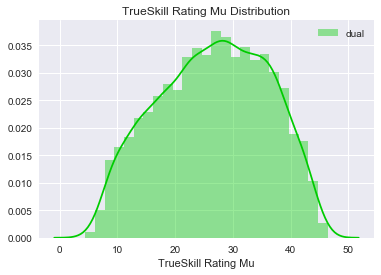

In [12]:
sns.set(color_codes=True)

# sns.distplot(chapineroOneMatch["actual"]["mu"], color="#0fddfd")
ax = sns.distplot(chapinero["dual"]["mu"] , color="#00cc00")
# sns.distplot(chapinero["0.3"]["mu"], color="#ffcc00")
# sns.distplot(chapinero["0.2"]["mu"], color="#ff0000")
# ax = sns.distplot(chapinero["0.1"]["mu"], color="#0033cc")
ax.set(xlabel='TrueSkill Rating Mu',
       title='TrueSkill Rating Mu Distribution')
ax.legend(["dual"])
plt.savefig('mimini', format='pdf')
plt.show()


/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


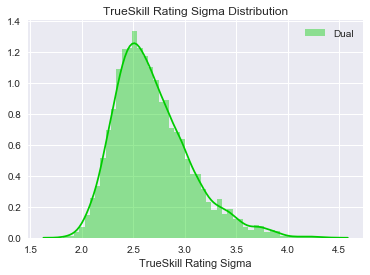

In [13]:
sns.set(color_codes=True)
# sns.distplot(chapineroOneMatch["actual"]["sigma"], color="#0fddfd")
ax = sns.distplot(chapinero["dual"]["sigma"] , color="#00cc00")
# sns.distplot(chapinero["0.3"]["sigma"], color="#ffcc00")
# sns.distplot(chapinero["0.2"]["sigma"], color="#ff0000")
# ax = sns.distplot(chapinero["0.1"]["sigma"], color="#0033cc")
ax.set(xlabel='TrueSkill Rating Sigma',
       title='TrueSkill Rating Sigma Distribution')
ax.legend(["Dual"])
plt.show()

## Synthetic Martires votes (3788 images, 37880 synthetic votes)
_____________________________________________________________________

### 0.3 probability difference threshold
_____________________________________________________________________

In [30]:
martires = {}
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.3,
                                          randomIndexerSPath = '../randomvotes/martirSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/martirSRandomVoteShIII.predict',
                                          imgSetSize = 3788,
                                          zoneName = "Sh3Martires")

martires["0.3"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(37880, 3)
(37881, 3)
Sh3Martires published image set size: 3788
Zero votes 13159
One votes 12322
Two votes 12399
Total votes 37880
Min mu 6.711074
Max mu 43.438511
Mean mu 24.559623
Std mu 6.205812
Min sigma 1.249886
Max sigma 3.708585
Mean sigma 2.055697
Std sigma 0.352537
Out file name randomIndexerSSh3MartOneMatchRating0p3.csv


### 0.2 probability difference threshold
_____________________________________________________________________

In [31]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.2,
                                          randomIndexerSPath = '../randomvotes/martirSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/martirSRandomVoteShIII.predict',
                                          imgSetSize = 3788,
                                          zoneName = "Sh3Martires")
martires["0.2"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(37880, 3)
(37881, 3)
Sh3Martires published image set size: 3788
Zero votes 8930
One votes 14446
Two votes 14504
Total votes 37880
Min mu 6.096742
Max mu 44.063955
Mean mu 24.511274
Std mu 7.277139
Min sigma 1.291224
Max sigma 3.811306
Mean sigma 2.230749
Std sigma 0.368598
Out file name randomIndexerSSh3MartOneMatchRating0p2.csv


### 0.1 probability difference threshold
_____________________________________________________________________

In [67]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.1,
                                          randomIndexerSPath = '../randomvotes/martirSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/martirSRandomVoteShIII.predict',
                                          imgSetSize = 3788,
                                          zoneName = "Sh3Martires")
martires["0.1"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(37880, 3)
(37881, 3)
Sh3Martires published image set size: 3788
Zero votes 4488
One votes 16616
Two votes 16776
Total votes 37880
Min mu 5.485748
Max mu 44.794781
Mean mu 24.455032
Std mu 8.360481
Min sigma 1.373250
Max sigma 3.911843
Mean sigma 2.439604
Std sigma 0.369620
Out file name randomIndexerSSh3MartOneMatchRating0p1.csv


### NO probability threshold, Dual Prediction
___

In [33]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleDualVoteTrueSkillExplorer(
                                          randomIndexerSPath = '../randomvotes/martirSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/martirSRandomVoteShIII.predict',
                                          randomSwpIndexerSPredictedPath = '../predicts/martirSRandomSwpdVoteShIII.predict',
                                          imgSetSize = 3788,
                                          zoneName = "Sh3Martires")
martires["dual"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(37880, 3)
(37881, 3)
(37881, 3)
Sh3Martires published image set size: 3788
Zero votes 20
One votes 18893
Two votes 18967
Total votes 37880
Min mu 4.221056
Max mu 45.899396
Mean mu 24.474772
Std mu 9.264788
Min sigma 1.728345
Max sigma 4.079470
Mean sigma 2.663423
Std sigma 0.345356
Out file name randomIndexerSSh3MartOneMatchRatingDual.csv


### Martires Mu and Sigma Distributions

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


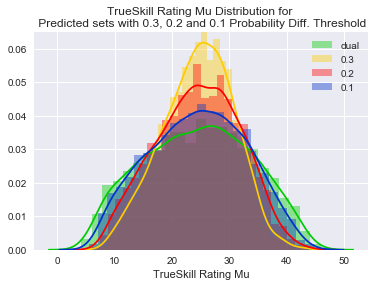

In [34]:
sns.set(color_codes=True)
sns.distplot(martires["dual"]["mu"], color="#00cc00")
sns.distplot(martires["0.3"]["mu"], color="#ffcc00")
sns.distplot(martires["0.2"]["mu"], color="#ff0000")
ax = sns.distplot(martires["0.1"]["mu"], color="#0033cc")
ax.set(xlabel='TrueSkill Rating Mu',
       title='TrueSkill Rating Mu Distribution for \n Predicted sets with 0.3, 0.2 and 0.1 Probability Diff. Threshold')
ax.legend(["dual","0.3","0.2","0.1"])
plt.show()

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


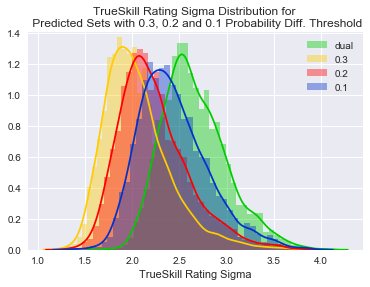

In [35]:
sns.set(color_codes=True)
sns.distplot(martires["dual"]["sigma"], color="#00cc00")
sns.distplot(martires["0.3"]["sigma"], color="#ffcc00")
sns.distplot(martires["0.2"]["sigma"], color="#ff0000")
ax = sns.distplot(martires["0.1"]["sigma"], color="#0033cc")
ax.set(xlabel='TrueSkill Rating Sigma',
       title='TrueSkill Rating Sigma Distribution for \n Predicted Sets with 0.3, 0.2 and 0.1 Probability Diff. Threshold')
ax.legend(["dual","0.3","0.2","0.1"])
plt.show()

### Synthetic Usaquen votes (9478 images, 94780 synthetic votes) Pendiente
_____________________________________________________________________

### 0.3 probability difference threshold
_____________________________________________________________________

In [77]:
usaquen = {}
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.3,
                                          randomIndexerSPath = '../randomvotes/usaquenSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/usaqueSRandomVoteShIII4.predict',
                                          imgSetSize = 9478,
                                          zoneName = "Sh3Usaquen")

usaquen["0.3"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(94780, 3)
(94781, 3)
Sh3Usaquen published image set size: 9478
Zero votes 26026
One votes 34353
Two votes 34401
Total votes 94780
Min mu 5.841403
Max mu 43.084965
Mean mu 23.829025
Std mu 7.215222
Min sigma 1.263082
Max sigma 3.950939
Mean sigma 2.190019
Std sigma 0.373507
Out file name randomIndexerSSh3UsaqOneMatchRating0p3.csv


### 0.2 probability difference threshold
_____________________________________________________________________

In [78]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.2,
                                          randomIndexerSPath = '../randomvotes/usaquenSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/usaqueSRandomVoteShIII4.predict',
                                          imgSetSize = 9478,
                                          zoneName = "Sh3Usaquen")

usaquen["0.2"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(94780, 3)
(94781, 3)
Sh3Usaquen published image set size: 9478
Zero votes 17585
One votes 38624
Two votes 38571
Total votes 94780
Min mu 5.251538
Max mu 43.574397
Mean mu 23.675911
Std mu 8.070190
Min sigma 1.275660
Max sigma 4.203875
Mean sigma 2.341785
Std sigma 0.381066
Out file name randomIndexerSSh3UsaqOneMatchRating0p2.csv


### 0.1 probability difference threshold
_____________________________________________________________________

In [79]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleVoteTrueSkillExplorer(probabilityDiffThreshold = 0.1,
                                          randomIndexerSPath = '../randomvotes/usaquenSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/usaqueSRandomVoteShIII4.predict',
                                          imgSetSize = 9478,
                                          zoneName = "Sh3Usaquen")

usaquen["0.1"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(94780, 3)
(94781, 3)
Sh3Usaquen published image set size: 9478
Zero votes 9038
One votes 42867
Two votes 42875
Total votes 94780
Min mu 4.569131
Max mu 43.832482
Mean mu 23.575092
Std mu 8.830037
Min sigma 1.286870
Max sigma 4.268921
Mean sigma 2.505170
Std sigma 0.377914
Out file name randomIndexerSSh3UsaqOneMatchRating0p1.csv


### NO probability threshold, Dual Prediction

In [81]:
mu, sigma, fileName, zeroVotes, oneVotes, twoVotes, totalVotes = syntheticOneMatchCycleDualVoteTrueSkillExplorer(
                                          randomIndexerSPath = '../randomvotes/usaquenSRandomVote4Predict_SchemIII.txt',
                                          randomIndexerSPredictedPath = '../predicts/usaqueSRandomVoteShIII4.predict',
                                          randomSwpIndexerSPredictedPath = '../predicts/usaqueSRandomSwpdVoteShIII4.predict',
                                          imgSetSize = 9478,
                                          zoneName = "Sh3Usaquen")
usaquen["dual"] = {"mu" : mu, "sigma" : sigma, "fileName" : fileName, "zeroVotes" : zeroVotes, "oneVotes" : oneVotes, "twoVotes" : twoVotes, "totalVotes" : totalVotes}

(94780, 3)
(94781, 3)
(94781, 3)
Sh3Usaquen published image set size: 9478
Zero votes 60
One votes 47352
Two votes 47368
Total votes 94780
Min mu 3.680159
Max mu 45.302290
Mean mu 23.484873
Std mu 9.541414
Min sigma 1.524465
Max sigma 4.458190
Mean sigma 2.687818
Std sigma 0.356080
Out file name randomIndexerSSh3UsaqOneMatchRatingDual.csv


## TrueSkill Single Match Example

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


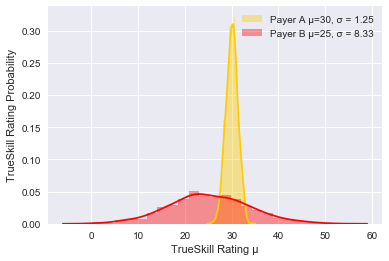

In [36]:
s1 = np.random.normal(30, 1.25, 1000)
s2 = np.random.normal(25, 8.33, 1000)
sns.set(color_codes=True)
sns.distplot(s1, color="#ffcc00")

ax = sns.distplot(s2, color="#ff0000")
ax.set(xlabel='TrueSkill Rating μ',
       ylabel='TrueSkill Rating Probability')
ax.legend(["Payer A μ=30, σ = 1.25","Payer B μ=25, σ = 8.33"])
plt.savefig('trueskill0', format='pdf')
plt.show()

/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/SerG1oAC/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


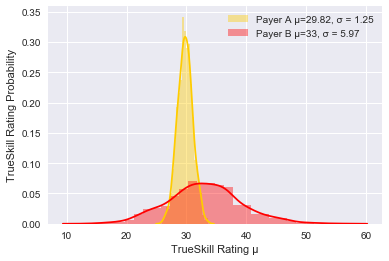

In [37]:
s1 = np.random.normal(29.82, 1.25, 1000)
s2 = np.random.normal(33, 5.97, 1000)
sns.set(color_codes=True)
sns.distplot(s1, color="#ffcc00")

ax = sns.distplot(s2, color="#ff0000")
ax.set(xlabel='TrueSkill Rating μ',
       ylabel='TrueSkill Rating Probability')
ax.legend(["Payer A μ=29.82, σ = 1.25","Payer B μ=33, σ = 5.97"])
plt.savefig('trueskill1', format='pdf')
plt.show()

# Ranking Visualization

In [15]:
font = {'family': 'arial',
        'color':  '#FFFF00',
        'weight': 'normal',
        'size': 16,
        }

## Actual Votes

Image Set Size 5505
40


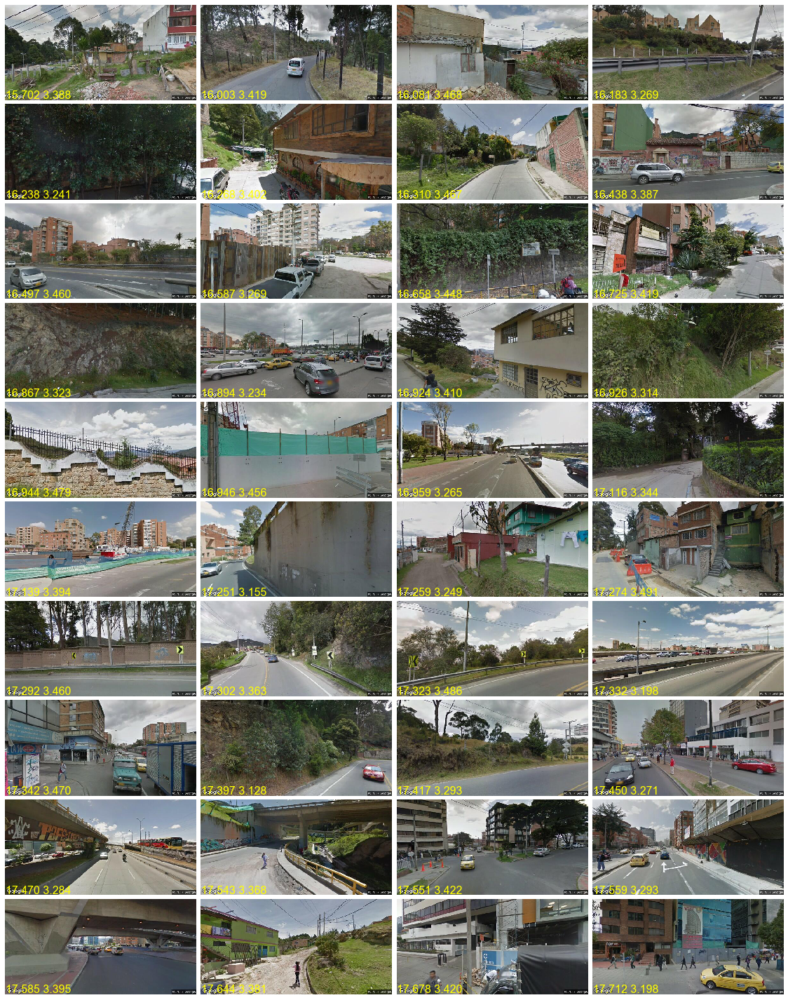

In [20]:
chapineroImgPath = "/Users/SerG1oAC/Documents/dbintroUdacity/fullstack/vagrant/ggStreetView/map/localidades/chapinero/imgs/"
martiresImgPath = "/Users/SerG1oAC/Documents/dbintroUdacity/fullstack/vagrant/ggStreetView/map/localidades/martires/imgs/"
usaquenImgPath = "/Users/SerG1oAC/Documents/dbintroUdacity/fullstack/vagrant/ggStreetView/map/localidades/usaquen/imgs/"
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 3.5,
                                searchOffset = 0,
                                rankingfile = "descriptorIndexer_Jul_0518OneMatchRating.csv",
                                imgList = "./zoneImgList/chapinero",
                                imgRootPath = chapineroImgPath)

print(len(imgPathList))

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(10, 4)
gs1.update(wspace=0.004, hspace=0.04, bottom=0.01, top=0.99) # set the spacing between axes. 

for i in range(40):
   # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    plt.axis('off')
    if len(imgPathList) > i:
        plt.imshow(mpimg.imread(imgPathList[i]["path"]))
        plt.text(0.7, 295, "%0.3f %0.3f" % (imgPathList[i]["mu"], imgPathList[i]["sg"]), fontdict=font)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    plt.subplot
    
plt.savefig('chapineroActuallTop40SVM_Worst.pdf', format='pdf')
plt.show()

Image Set Size 5505
40


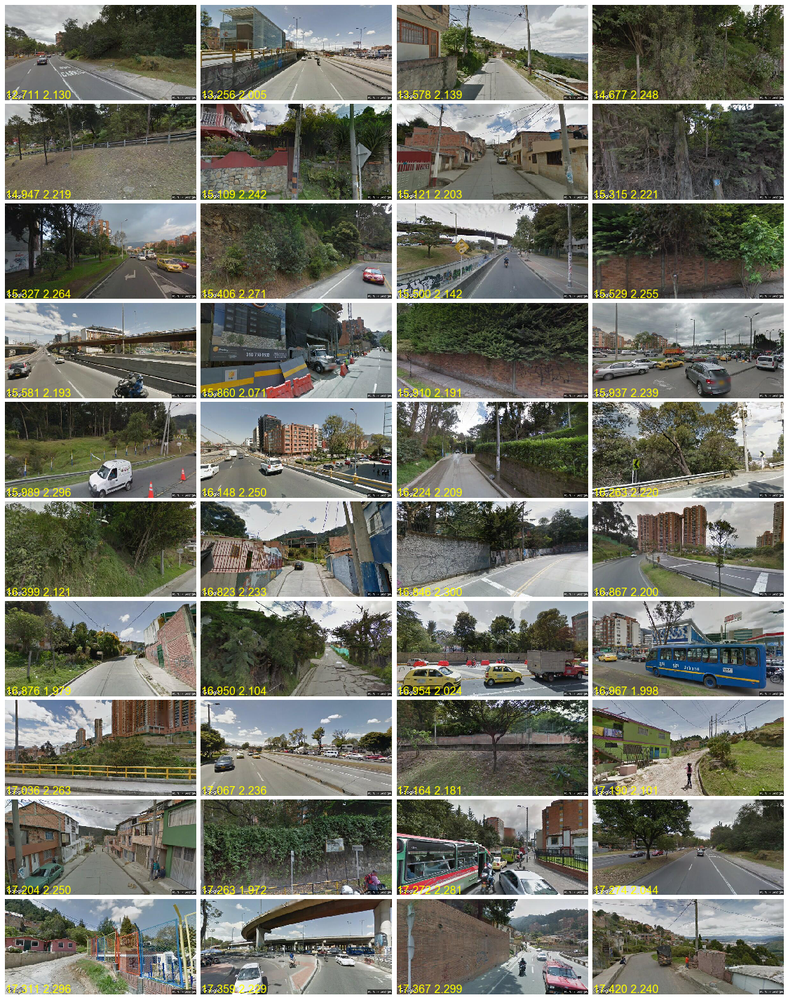

In [31]:
"""
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 2.7,
                                searchOffset = 0,
                                rankingfile = "randomIndexerSSh3ChapOneMatchRatingDual.csv",
                                imgList = "./zoneImgList/chapinero",
                                imgRootPath = chapineroImgPath)


"""
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 2.3,
                                searchOffset = 0,
                                rankingfile = "rdmIdxerS3ChapineroOneMatchRatingVGG19.csv",
                                imgList = "./zoneImgList/chapinero",
                                imgRootPath = chapineroImgPath)


print(len(imgPathList))

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(10, 4)
gs1.update(wspace=0.004, hspace=0.04, bottom=0.01, top=0.99) # set the spacing between axes. 

for i in range(40):
   # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    plt.axis('off')
    if len(imgPathList) > i:
        plt.imshow(mpimg.imread(imgPathList[i]["path"]))
        plt.text(0.7, 295, "%0.3f %0.3f" % (imgPathList[i]["mu"], imgPathList[i]["sg"]), fontdict=font)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    plt.subplot
    
plt.savefig('chapineroSyntheticTop40VGG19_Worst.pdf', format='pdf')
plt.show()

Image Set Size 3788
40


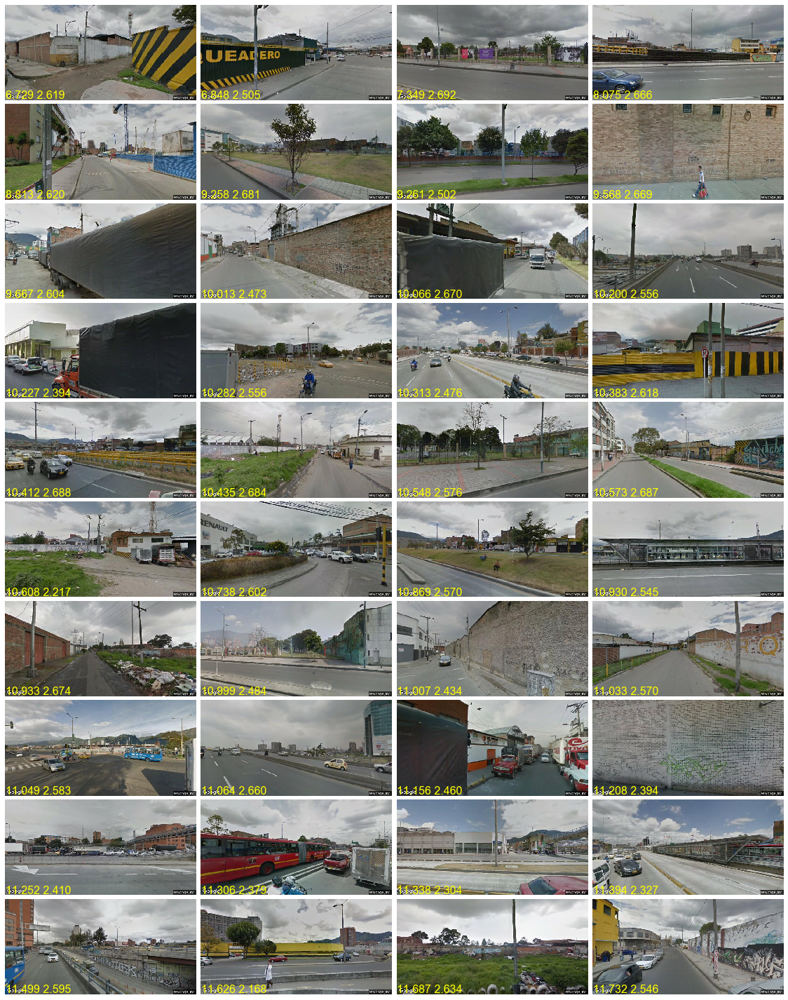

In [39]:
"""
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 3,
                                searchOffset = 0,
                                rankingfile = "randomIndexerSSh3MartOneMatchRatingDual.csv",
                                imgList = "./zoneImgList/martires",
                                imgRootPath = martiresImgPath)
"""

imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 2.7,
                                searchOffset = 0,
                                rankingfile = "rdmIdxerS3MartirezOneMatchRatingVGG19.csv",
                                imgList = "./zoneImgList/martires",
                                imgRootPath = martiresImgPath)

print(len(imgPathList))

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(10, 4)
gs1.update(wspace=0.004, hspace=0.04, bottom=0.01, top=0.99) # set the spacing between axes. 

for i in range(40):
   # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    plt.axis('off')
    if len(imgPathList) > i:
        plt.imshow(mpimg.imread(imgPathList[i]["path"]))
        plt.text(0.7, 295, "%0.3f %0.3f" % (imgPathList[i]["mu"], imgPathList[i]["sg"]), fontdict=font)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    plt.subplot
    
plt.savefig('martiresSyntheticTop40VGG19_Worst.pdf', format='pdf')
plt.show()

Image Set Size 9478
40


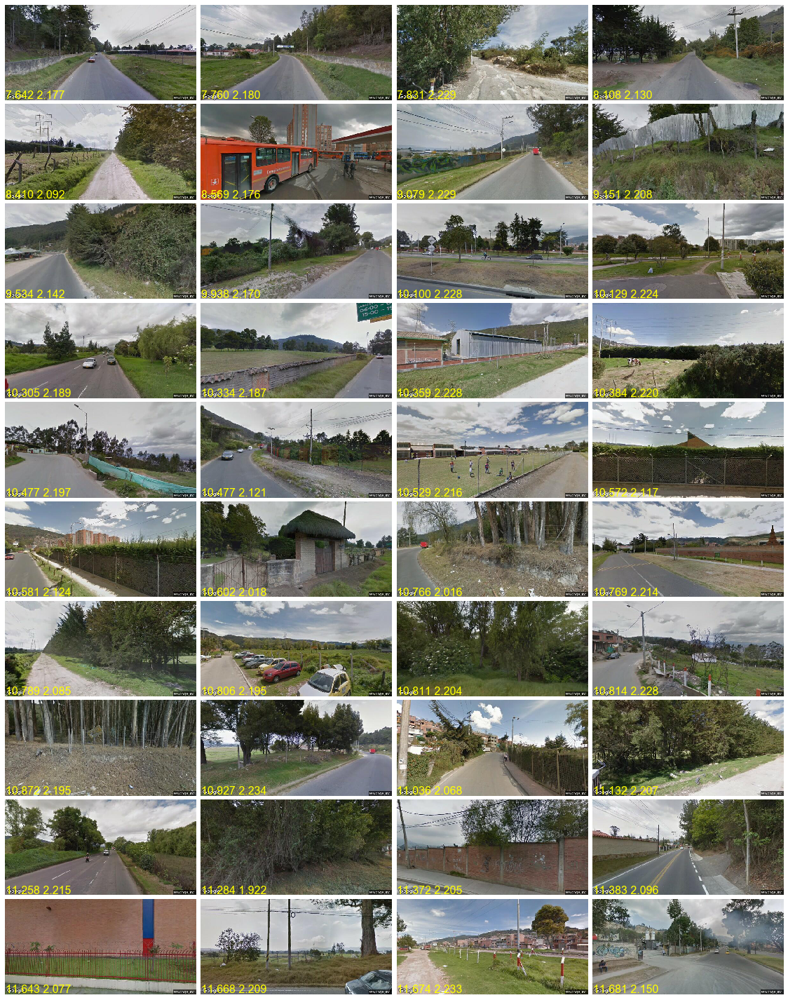

In [42]:
"""
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 3,
                                searchOffset = 0,
                                rankingfile = "randomIndexerSSh3UsaqOneMatchRatingDual.csv",
                                imgList = "./zoneImgList/usaquen",
                                imgRootPath = usaquenImgPath)
"""
imgPathList = rankingImgRequest(order = -1,
                                number = 40,
                                sigmaThreshold = 2.24,
                                searchOffset = 0,
                                rankingfile = "rdmIdxerS3UsaquenOneMatchRatingVGG19.csv",
                                imgList = "./zoneImgList/usaquen",
                                imgRootPath = usaquenImgPath)

print(len(imgPathList))

plt.figure(figsize = (20,20))
gs1 = gridspec.GridSpec(10, 4)
gs1.update(wspace=0.004, hspace=0.04, bottom=0.01, top=0.99) # set the spacing between axes. 

for i in range(40):
   # i = i + 1 # grid spec indexes from 0
    ax1 = plt.subplot(gs1[i])
    plt.axis('off')
    if len(imgPathList) > i:
        plt.imshow(mpimg.imread(imgPathList[i]["path"]))
        plt.text(0.7, 295, "%0.3f %0.3f" % (imgPathList[i]["mu"], imgPathList[i]["sg"]), fontdict=font)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    plt.subplot
    
plt.savefig('usaquenSyntheticTop40VGG19_Worst.pdf', format='pdf')
plt.show()